# I.INTRODUCTION

Name : Kevin David Hizkia Simangunsong

Dataset : This dataset contains three folders:

- train (100 images each)
- test (10 images each)
- validation (10 images each)

each of the above folders contains subfolders for different fruit & vegetables where in the images for respective image are present.

Problem Statement : saya adalah seorang data scientis, yang diminta oleh sebuah perusahaan berbasis fruit & vegetable delivery. mereka mengalami kendala dalam melakukan sorting barang nya, sehingga saya diminta untuk membuat model berbasis ANN(Artificial neural Network) untuk mempermudah pekerjaan. Tunjuan dari pembuatan model adalah untuk melakukan identifikasi terhadap barang dengan cara memberi label.


# II.IMPORT LIBRARY

In [1]:
# acces folder
import os
import glob
import random

# data loading
import numpy as np
import pandas as pd
import cv2

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocessing and Models
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input
from sklearn.model_selection import train_test_split

# Model Evaluation
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score,classification_report,ConfusionMatrixDisplay,confusion_matrix
import warnings

import pdb
# transfer learning
import tensorflow_hub as hub
warnings.filterwarnings('ignore')

In [2]:
np.set_printoptions(suppress=True)

In [3]:
# connect to drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# III.DATA LOADING

In [4]:
# create kaggle directory
!mkdir ~/.kaggle

In [5]:
# !pip install kaggle

In [6]:
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle

In [7]:
!kaggle datasets download -d kritikseth/fruit-and-vegetable-image-recognition

100% 1.98G/1.98G [00:19<00:00, 85.4MB/s]
100% 1.98G/1.98G [00:19<00:00, 109MB/s] 


In [8]:
# !kaggle datasets download -d kritikseth/fruit-and-vegetable-image-recognition --force

In [9]:
!unzip -q /content/fruit-and-vegetable-image-recognition.zip -d images

In [10]:
main_path = '/content/images'
os.listdir(main_path)

['test', 'train', 'validation']

Pertama membuat variable untuk train,test,dan validation dari path yang sudah dibuat, sehingga data dapat di load.

In [11]:
# create variable for train, test, validation directory
train_dir = os.path.join(main_path, 'train')
test_dir = os.path.join(main_path, 'test')
val_dir = os.path.join(main_path, 'validation')
print(train_dir)
print(test_dir)
print(val_dir)

/content/images/train
/content/images/test
/content/images/validation


Kemudian saya akan membuat variable class fruit & vegetable berdasarkan folder yang sudah ada.

In [12]:
# create class variable
# train class
train_Apple = len(os.listdir(os.path.join(train_dir, 'apple')))
train_Banana = len(os.listdir(os.path.join(train_dir, 'banana')))
train_Cabbage = len(os.listdir(os.path.join(train_dir, 'cabbage')))
train_Eggplant = len(os.listdir(os.path.join(train_dir, 'eggplant')))
train_Garlic = len(os.listdir(os.path.join(train_dir, 'garlic')))
train_Jalepeno = len(os.listdir(os.path.join(train_dir, 'jalepeno')))
train_Kiwi = len(os.listdir(os.path.join(train_dir, 'kiwi')))
train_Lemon = len(os.listdir(os.path.join(train_dir, 'lemon')))
train_Mango = len(os.listdir(os.path.join(train_dir, 'mango')))
train_Onion = len(os.listdir(os.path.join(train_dir, 'onion')))
train_Orange = len(os.listdir(os.path.join(train_dir, 'orange')))
train_Paprika = len(os.listdir(os.path.join(train_dir, 'paprika')))
train_Pear = len(os.listdir(os.path.join(train_dir, 'pear')))
train_Raddish = len(os.listdir(os.path.join(train_dir, 'raddish')))
train_Soy_beans = len(os.listdir(os.path.join(train_dir, 'soy beans')))
train_Tomato = len(os.listdir(os.path.join(train_dir, 'tomato')))
train_Watermelon = len(os.listdir(os.path.join(train_dir, 'watermelon')))

# test
test_Apple = len(os.listdir(os.path.join(test_dir, 'apple')))
test_Banana = len(os.listdir(os.path.join(test_dir, 'banana')))
test_Cabbage = len(os.listdir(os.path.join(test_dir, 'cabbage')))
test_Eggplant = len(os.listdir(os.path.join(test_dir, 'eggplant')))
test_Garlic = len(os.listdir(os.path.join(test_dir, 'garlic')))
test_Jalepeno = len(os.listdir(os.path.join(test_dir, 'jalepeno')))
test_Kiwi = len(os.listdir(os.path.join(test_dir, 'kiwi')))
test_Lemon = len(os.listdir(os.path.join(test_dir, 'lemon')))
test_Mango = len(os.listdir(os.path.join(test_dir, 'mango')))
test_Onion = len(os.listdir(os.path.join(test_dir, 'onion')))
test_Orange = len(os.listdir(os.path.join(test_dir, 'orange')))
test_Paprika = len(os.listdir(os.path.join(test_dir, 'paprika')))
test_Pear = len(os.listdir(os.path.join(test_dir, 'pear')))
test_Raddish = len(os.listdir(os.path.join(test_dir, 'raddish')))
test_Soy_beans = len(os.listdir(os.path.join(test_dir, 'soy beans')))
test_Tomato = len(os.listdir(os.path.join(test_dir, 'tomato')))
test_Watermelon = len(os.listdir(os.path.join(test_dir, 'watermelon')))

# Validation
val_Apple = len(os.listdir(os.path.join(val_dir, 'apple')))
val_Banana = len(os.listdir(os.path.join(val_dir, 'banana')))
val_Cabbage = len(os.listdir(os.path.join(val_dir, 'cabbage')))
val_Eggplant = len(os.listdir(os.path.join(val_dir, 'eggplant')))
val_Garlic = len(os.listdir(os.path.join(val_dir, 'garlic')))
val_Jalepeno = len(os.listdir(os.path.join(val_dir, 'jalepeno')))
val_Kiwi = len(os.listdir(os.path.join(val_dir, 'kiwi')))
val_Lemon = len(os.listdir(os.path.join(val_dir, 'lemon')))
val_Mango = len(os.listdir(os.path.join(val_dir, 'mango')))
val_Onion = len(os.listdir(os.path.join(val_dir, 'onion')))
val_Orange = len(os.listdir(os.path.join(val_dir, 'orange')))
val_Paprika = len(os.listdir(os.path.join(val_dir, 'paprika')))
val_Pear = len(os.listdir(os.path.join(val_dir, 'pear')))
val_Raddish = len(os.listdir(os.path.join(val_dir, 'raddish')))
val_Soy_beans = len(os.listdir(os.path.join(val_dir, 'soy beans')))
val_Tomato = len(os.listdir(os.path.join(val_dir, 'tomato')))
val_Watermelon = len(os.listdir(os.path.join(val_dir, 'watermelon')))

Selanjutnya saya akan memghitung total image di setiap class yang sudah dibuat

In [14]:
# data count

print('Train Dataset')
print('Total Data of train_Apple : ', train_Apple)
print('Total Data of train_Banana : ', train_Banana)
print('Total Data of train_Cabbage : ', train_Cabbage)
print('Total Data of train_Eggplant : ', train_Eggplant)
print('Total Data of train_Garlic : ', train_Garlic)
print('Total Data of train_Jalepeno : ', train_Jalepeno)
print('Total Data of train_Kiwi : ', train_Kiwi)
print('Total Data of train_Lemon : ', train_Lemon)
print('Total Data of train_Mango : ', train_Mango)
print('Total Data of train_Onion : ', train_Onion)
print('Total Data of train_Orange : ', train_Orange)
print('Total Data of train_Paprika : ', train_Paprika)
print('Total Data of train_Pear : ', train_Pear)
print('Total Data of train_Raddish : ', train_Raddish)
print('Total Data of train_Soy_Beans : ', train_Soy_beans)
print('Total Data of train_Tomato : ', train_Tomato)
print('Total Data of train_Watermelon : ', train_Watermelon)

Train Dataset
Total Data of train_Apple :  68
Total Data of train_Banana :  75
Total Data of train_Cabbage :  92
Total Data of train_Eggplant :  84
Total Data of train_Garlic :  92
Total Data of train_Jalepeno :  88
Total Data of train_Kiwi :  88
Total Data of train_Lemon :  82
Total Data of train_Mango :  86
Total Data of train_Onion :  94
Total Data of train_Orange :  69
Total Data of train_Paprika :  83
Total Data of train_Pear :  89
Total Data of train_Raddish :  81
Total Data of train_Soy_Beans :  97
Total Data of train_Tomato :  92
Total Data of train_Watermelon :  84


Dari data diatas dapat dilihat total image di setiap class train

In [15]:
# data count

print('test Dataset')
print('Total Data of test_Apple : ', test_Apple)
print('Total Data of test_Banana : ', test_Banana)
print('Total Data of test_Cabbage : ', test_Cabbage)
print('Total Data of test_Eggplant : ', test_Eggplant)
print('Total Data of test_Garlic : ', test_Garlic)
print('Total Data of test_Jalepeno : ', test_Jalepeno)
print('Total Data of test_Kiwi : ', test_Kiwi)
print('Total Data of test_Lemon : ', test_Lemon)
print('Total Data of test_Mango : ', test_Mango)
print('Total Data of test_Onion : ', test_Onion)
print('Total Data of test_Orange : ', test_Orange)
print('Total Data of test_Paprika : ', test_Paprika)
print('Total Data of test_Pear : ', test_Pear)
print('Total Data of test_Raddish : ', test_Raddish)
print('Total Data of test_Soy_Beans : ', test_Soy_beans)
print('Total Data of test_Tomato : ', test_Tomato)
print('Total Data of test_Watermelon : ', test_Watermelon)

test Dataset
Total Data of test_Apple :  10
Total Data of test_Banana :  9
Total Data of test_Cabbage :  10
Total Data of test_Eggplant :  10
Total Data of test_Garlic :  10
Total Data of test_Jalepeno :  10
Total Data of test_Kiwi :  10
Total Data of test_Lemon :  10
Total Data of test_Mango :  10
Total Data of test_Onion :  10
Total Data of test_Orange :  10
Total Data of test_Paprika :  10
Total Data of test_Pear :  10
Total Data of test_Raddish :  10
Total Data of test_Soy_Beans :  10
Total Data of test_Tomato :  10
Total Data of test_Watermelon :  10


Dari data diatas dapat dilihat total image di setiap class test

In [16]:
# data count

print('val Dataset')
print('Total Data of val_Apple : ', val_Apple)
print('Total Data of val_Banana : ', val_Banana)
print('Total Data of val_Cabbage : ', val_Cabbage)
print('Total Data of val_Eggplant : ', val_Eggplant)
print('Total Data of val_Garlic : ', val_Garlic)
print('Total Data of val_Jalepeno : ', val_Jalepeno)
print('Total Data of val_Kiwi : ', val_Kiwi)
print('Total Data of val_Lemon : ', val_Lemon)
print('Total Data of val_Mango : ', val_Mango)
print('Total Data of val_Onion : ', val_Onion)
print('Total Data of val_Orange : ', val_Orange)
print('Total Data of val_Paprika : ', val_Paprika)
print('Total Data of val_Pear : ', val_Pear)
print('Total Data of val_Raddish : ', val_Raddish)
print('Total Data of val_Soy_Beans : ', val_Soy_beans)
print('Total Data of val_Tomato : ', val_Tomato)
print('Total Data of val_Watermelon : ', val_Watermelon)

val Dataset
Total Data of val_Apple :  10
Total Data of val_Banana :  9
Total Data of val_Cabbage :  10
Total Data of val_Eggplant :  10
Total Data of val_Garlic :  10
Total Data of val_Jalepeno :  9
Total Data of val_Kiwi :  10
Total Data of val_Lemon :  10
Total Data of val_Mango :  10
Total Data of val_Onion :  10
Total Data of val_Orange :  9
Total Data of val_Paprika :  10
Total Data of val_Pear :  10
Total Data of val_Raddish :  9
Total Data of val_Soy_Beans :  10
Total Data of val_Tomato :  10
Total Data of val_Watermelon :  10


Dari data diatas dapat dilihat total image di setiap class test, kemudian saya akan membuat variable untuk membaca file dalam bentuk file `.jpg` dengan menggunakan library `glob`

In [17]:
# Create a variable from filepaths

#train

train_Apple= glob.glob(train_dir + '/apple/*.jpg')
train_Banana= glob.glob(train_dir + '/banana/*.jpg')

train_Cabbage= glob.glob(train_dir + '/cabbage/*.jpg')
train_Eggplant= glob.glob(train_dir + '/eggplant/*.jpg')
train_Garlic= glob.glob(train_dir + '/garlic/*.jpg')


train_Jalepeno= glob.glob(train_dir + '/jalepeno/*.jpg')
train_Kiwi= glob.glob(train_dir + '/kiwi/*.jpg')
train_Lemon= glob.glob(train_dir + '/lemon/*.jpg')

train_Mango= glob.glob(train_dir + '/mango/*.jpg')
train_Onion= glob.glob(train_dir + '/onion/*.jpg')
train_Orange= glob.glob(train_dir + '/orange/*.jpg')

train_Paprika= glob.glob(train_dir + '/paprika/*.jpg')
train_Pear= glob.glob(train_dir + '/pear/*.jpg')
train_Raddish= glob.glob(train_dir + '/raddish/*.jpg')

train_Soy_beans= glob.glob(train_dir + '/soy beans/*.jpg')
train_Tomato= glob.glob(train_dir + '/tomato/*.jpg')
train_Watermelon= glob.glob(train_dir + '/watermelon/*.jpg')


In [18]:
# Create a variable from filepaths

#test

test_Apple= glob.glob(test_dir + '/apple/*.jpg')
test_Banana= glob.glob(test_dir + '/banana/*.jpg')

test_Cabbage= glob.glob(test_dir + '/cabbage/*.jpg')
test_Eggplant= glob.glob(test_dir + '/eggplant/*.jpg')
test_Garlic= glob.glob(test_dir + '/garlic/*.jpg')


test_Jalepeno= glob.glob(test_dir + '/jalepeno/*.jpg')
test_Kiwi= glob.glob(test_dir + '/kiwi/*.jpg')
test_Lemon= glob.glob(test_dir + '/lemon/*.jpg')

test_Mango= glob.glob(test_dir + '/mango/*.jpg')
test_Onion= glob.glob(test_dir + '/onion/*.jpg')
test_Orange= glob.glob(test_dir + '/orange/*.jpg')

test_Paprika= glob.glob(test_dir + '/paprika/*.jpg')
test_Pear= glob.glob(test_dir + '/pear/*.jpg')
test_Raddish= glob.glob(test_dir + '/raddish/*.jpg')

test_Soy_beans= glob.glob(test_dir + '/soy beans/*.jpg')
test_Tomato= glob.glob(test_dir + '/tomato/*.jpg')
test_Watermelon= glob.glob(test_dir + '/watermelon/*.jpg')


In [19]:
# Create a variable from filepaths

#validation

val_Apple= glob.glob(val_dir + '/apple/*.jpg')
val_Banana= glob.glob(val_dir + '/banana/*.jpg')

val_Cabbage= glob.glob(val_dir + '/cabbage/*.jpg')
val_Eggplant= glob.glob(val_dir + '/eggplant/*.jpg')
val_Garlic= glob.glob(val_dir + '/garlic/*.jpg')


val_Jalepeno= glob.glob(val_dir + '/jalepeno/*.jpg')
val_Kiwi= glob.glob(val_dir + '/kiwi/*.jpg')
val_Lemon= glob.glob(val_dir + '/lemon/*.jpg')

val_Mango= glob.glob(val_dir + '/mango/*.jpg')
val_Onion= glob.glob(val_dir + '/onion/*.jpg')
val_Orange= glob.glob(val_dir + '/orange/*.jpg')

val_Paprika= glob.glob(val_dir + '/paprika/*.jpg')
val_Pear= glob.glob(val_dir + '/pear/*.jpg')
val_Raddish= glob.glob(val_dir + '/raddish/*.jpg')

val_Soy_beans= glob.glob(val_dir + '/soy beans/*.jpg')
val_Tomato= glob.glob(val_dir + '/tomato/*.jpg')
val_Watermelon= glob.glob(val_dir + '/watermelon/*.jpg')


In [20]:
(val_Apple + val_Banana +  val_Cabbage + val_Eggplant + val_Garlic
                            +  val_Jalepeno + val_Kiwi + val_Lemon +  val_Mango + val_Onion
                            + val_Orange + val_Paprika + val_Pear +  val_Raddish + val_Soy_beans
                            +  val_Tomato + val_Watermelon)

['/content/images/validation/apple/Image_8.jpg',
 '/content/images/validation/apple/Image_2.jpg',
 '/content/images/validation/apple/Image_7.jpg',
 '/content/images/validation/apple/Image_5.jpg',
 '/content/images/validation/apple/Image_3.jpg',
 '/content/images/validation/apple/Image_9.jpg',
 '/content/images/validation/apple/Image_10.jpg',
 '/content/images/validation/apple/Image_4.jpg',
 '/content/images/validation/apple/Image_1.jpg',
 '/content/images/validation/banana/Image_8.jpg',
 '/content/images/validation/banana/Image_2.jpg',
 '/content/images/validation/banana/Image_5.jpg',
 '/content/images/validation/banana/Image_3.jpg',
 '/content/images/validation/banana/Image_6.jpg',
 '/content/images/validation/banana/Image_9.jpg',
 '/content/images/validation/banana/Image_10.jpg',
 '/content/images/validation/banana/Image_4.jpg',
 '/content/images/validation/banana/Image_1.jpg',
 '/content/images/validation/cabbage/Image_8.jpg',
 '/content/images/validation/cabbage/Image_2.jpg',
 '/co

Selanjutnya saya akan memasukan data yang sudah berhasil di baca dengan `glob` dan memasukan nya kedalam dataframe dengan memisahkan antara `image` dan `label`

In [21]:
# Creating dataset train, test, validation

def create_dataframe(list_of_images):
  data=[]
  for image in list_of_images:
    data.append((image, image.split('/')[-2]))

  return pd.DataFrame(data, columns= ['images', 'label'])

# Train Dataframe
train_df = create_dataframe(train_Apple + train_Banana +  train_Cabbage + train_Eggplant + train_Garlic
                            +  train_Jalepeno + train_Kiwi + train_Lemon +  train_Mango + train_Onion
                            + train_Orange + train_Paprika + train_Pear +  train_Raddish + train_Soy_beans
                            +  train_Tomato + train_Watermelon)
train_df = train_df.sample(frac=1, random_state=7).reset_index(drop=True)

# Test Dataframe
test_df = create_dataframe(test_Apple + test_Banana +  test_Cabbage + test_Eggplant + test_Garlic
                            +  test_Jalepeno + test_Kiwi + test_Lemon +  test_Mango + test_Onion
                            + test_Orange + test_Paprika + test_Pear +  test_Raddish + test_Soy_beans
                            +  test_Tomato + test_Watermelon)
test_df = test_df.sample(frac=1, random_state=7).reset_index(drop=True)

# Validation Dataframe
val_df = create_dataframe(val_Apple + val_Banana +  val_Cabbage + val_Eggplant + val_Garlic
                            +  val_Jalepeno + val_Kiwi + val_Lemon +  val_Mango + val_Onion
                            + val_Orange + val_Paprika + val_Pear +  val_Raddish + val_Soy_beans
                            +  val_Tomato + val_Watermelon)
val_df = val_df.sample(frac=1, random_state=7).reset_index(drop=True)

In [22]:
# split to inference dataset

test_df, inf_df = train_test_split(test_df, test_size=0.02, random_state=7)
print(test_df)
print(inf_df)

                                         images      label
107     /content/images/test/orange/Image_3.jpg     orange
74     /content/images/test/cabbage/Image_7.jpg    cabbage
88      /content/images/test/tomato/Image_9.jpg     tomato
115     /content/images/test/banana/Image_2.jpg     banana
146  /content/images/test/soy beans/Image_4.jpg  soy beans
..                                          ...        ...
92       /content/images/test/lemon/Image_4.jpg      lemon
103     /content/images/test/orange/Image_6.jpg     orange
151    /content/images/test/cabbage/Image_6.jpg    cabbage
67      /content/images/test/garlic/Image_6.jpg     garlic
25   /content/images/test/soy beans/Image_3.jpg  soy beans

[154 rows x 2 columns]
                                       images    label
149    /content/images/test/onion/Image_9.jpg    onion
86   /content/images/test/cabbage/Image_8.jpg  cabbage
63    /content/images/test/garlic/Image_2.jpg   garlic
80   /content/images/test/raddish/Image_3.jpg  r

dari hasil output diatas dapat dilihat bahwa data file sudah berhasil di buat dalam dataframe

# IV.EXPLORATORY DATA ANALYSIS (EDA)

Pada bagian Eda saya akan membuat fungsi untuk menampilkan total 10 image per class dan membuat karakteristik yang dimiliki oleh setiap class.

In [23]:
#function to visualize each class

def visualize_samples_by_label(df, label, num_samples=20):
    samples = df[df['label'] == label]['images'].iloc[:num_samples].tolist()
    num_cols = min(num_samples, 5)
    num_rows = (num_samples - 1) // num_cols + 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(10, 2 * num_rows))
    count = 0
    for i in range(num_rows):
        for j in range(num_cols):
            if count < len(samples):
                sample = samples[count]
                img = cv2.imread(sample)
                ax = axes[i, j]
                ax.set_title(sample.split('/')[-1])
                ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                ax.axis('off')
                count += 1
    plt.tight_layout()
    plt.show()

1. Apple

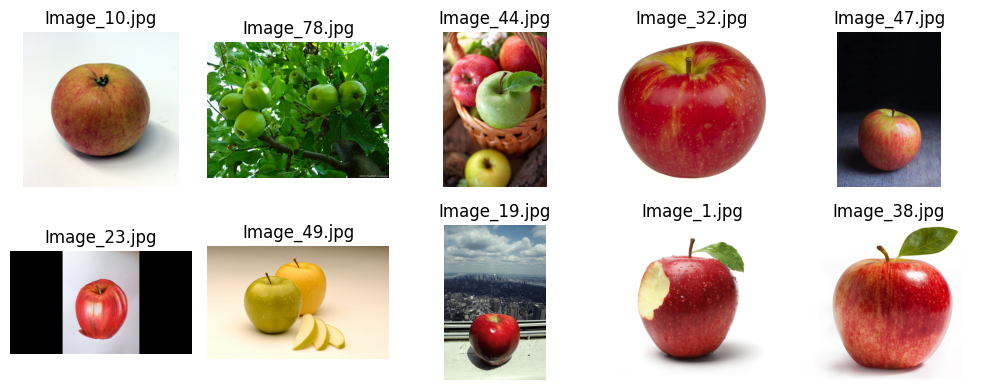

In [24]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'apple', num_samples=10)

**Characteristics**

Color : Red,Green,Purple,Yellow

Shape: Apel ukuran umumnya kecil, dan memiliki bentuk bulat.

Health Benefits: Apples can do a lot for you, thanks to plant chemicals called flavonoids. And they have pectin, a fiber that breaks down in your gut. If you take off the apple's skin before eating it, you won't get as much of the fiber or flavonoids.

Reference : https://www.webmd.com/food-recipes/benefits-apples


2.Banana

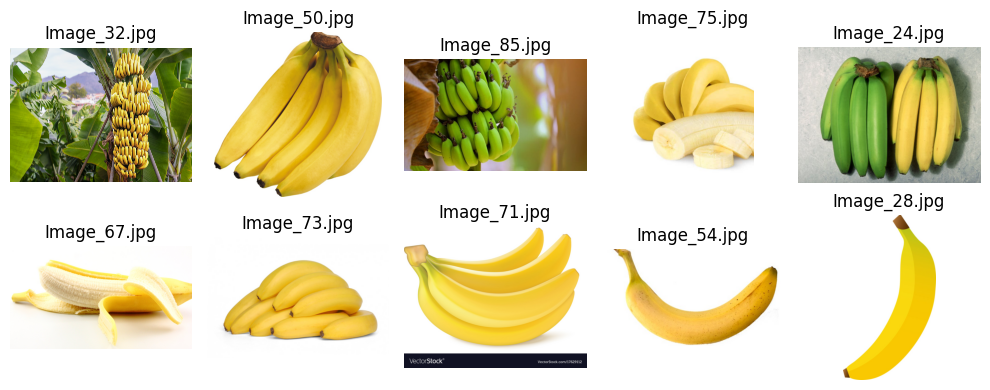

In [25]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'banana', num_samples=10)

**Characteristics**

Color : Yellow,Green,White

Shape: Apel ukuran umumnya kecil, dan memiliki bentuk lonjong.

Health Benefits: Both bananas and banana peels may offer different health benefits depending on their level of ripeness. Underripe, green bananas may be more effective in treating digestive issues, while riper, blackened bananas have been shown to help white blood cells fight off disease and infection.

Reference : https://www.webmd.com/diet/health-benefits-banana-peppers

3.Cabbage

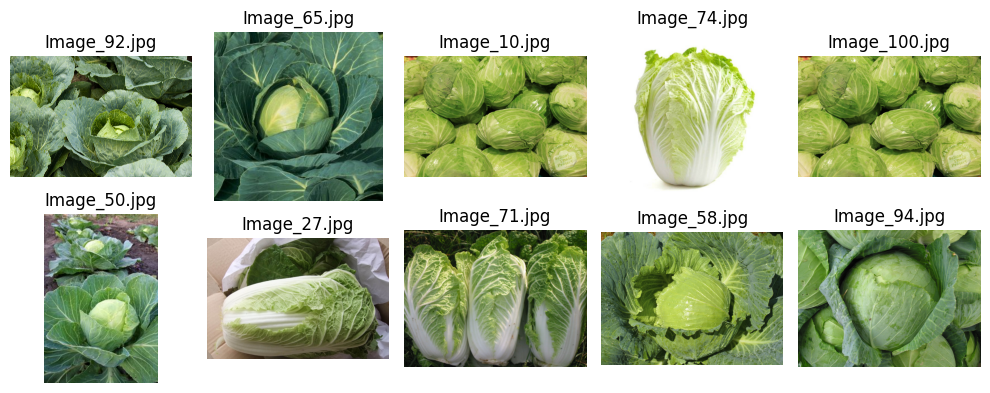

In [26]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'cabbage', num_samples=10)

**Characteristics**

Color : Green

Shape: Cabbage ukuran umumnya besar, dan memiliki bentuk bundar.

Health Benefits: Cabbage is low in calories and high in fiber. This makes it an excellent option for maintaining a healthy digestive tract. Additionally, cabbage contains a variety of antioxidant compounds that fight free radicals and reduce stress on your cells. Anthocyanin in particular has a number of benefits, including the protection of red blood cells.

Reference : https://www.webmd.com/diet/health-benefits-cabbage

4.Eggplant

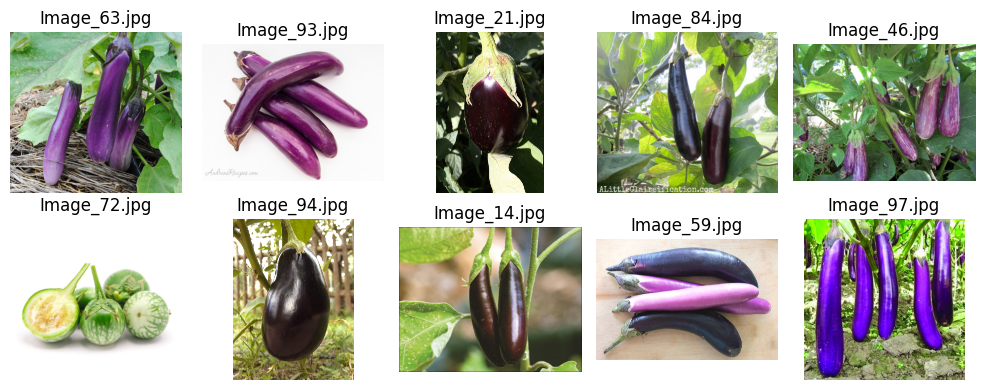

In [27]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'eggplant', num_samples=10)

**Characteristics**

Color : purple,dak purple

Shape: Eggplant ukuran umumnya kecil, dan memiliki bentuk lonjong.

Health Benefits: The dark purple skin of eggplant contains nasunin, a unique antioxidant that experts believe may preserve and protect cell membranes. Early studies show that it may protect the fats in the membranes, which are responsible for protecting the cells from harmful free radicals.

Reference : https://www.webmd.com/diet/health-benefits-of-eggplant

5.Garlic

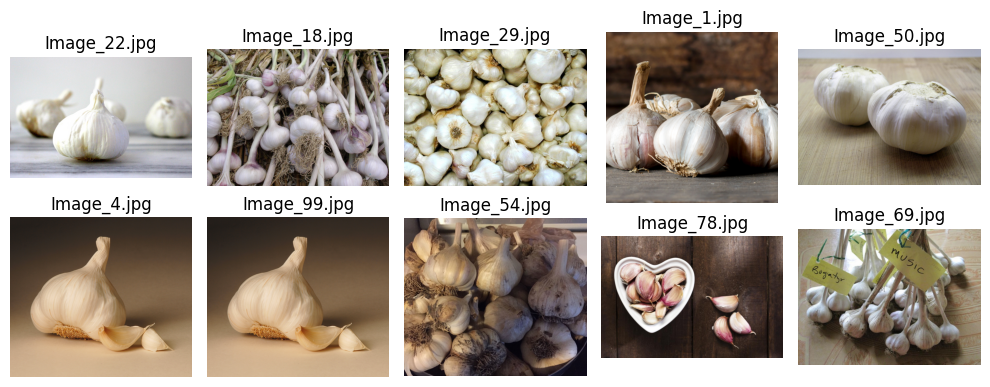

In [28]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'garlic', num_samples=10)

**Characteristics**

Color : white

Shape: Garlic ukuran umumnya kecil, dan memiliki bentuk bundar.

Health Benefits: Medical research links garlic to a number of health benefits. However, some studies have suggested that raw garlic may be more effective than the cooked version, while garlic supplements are the most effective. Garlic tea retains the health benefits of raw garlic, as long as it is prepared properly: the key is boiling your crushed garlic no longer than 3 minutes.

Reference : https://www.webmd.com/diet/garlic-good-for-you

6.Jalepeno

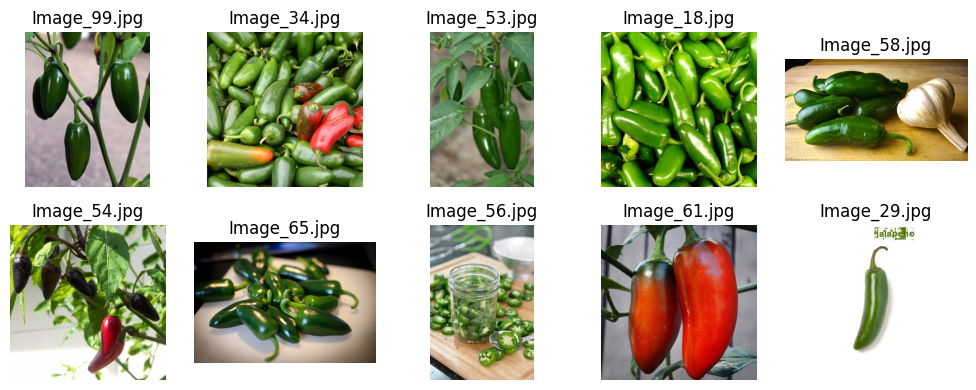

In [29]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'jalepeno', num_samples=10)

**Characteristics**

Color : red,orange,green

Shape: Jalapeno ukuran umumnya kecil, dan memiliki bentuk lonjong.

Health Benefits: Jalapeños are rich in vitamins A and C and potassium. They also have carotene -- an antioxidant that may help fight damage to your cells – as well as folate, vitamin K, and B vitamins. Many of their health benefits come from a compound called capsaicin. That's what makes the peppers spicy.

Reference : https://www.webmd.com/food-recipes/health-benefits-jalapenos

7.Kiwi

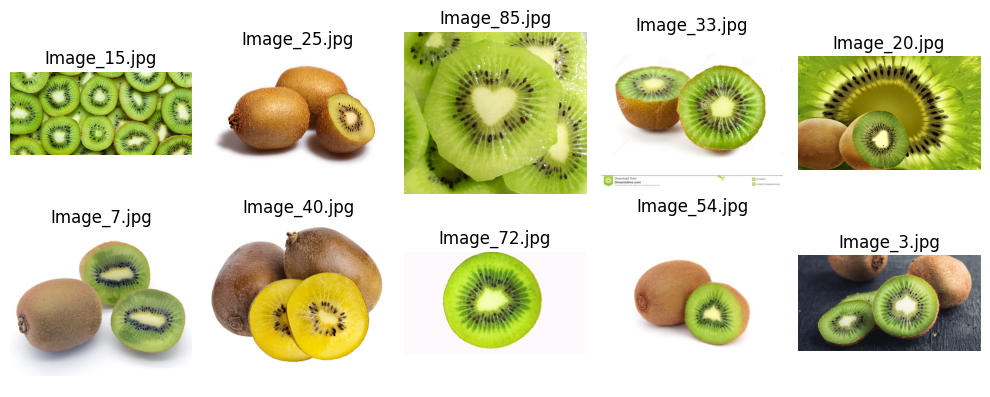

In [30]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'kiwi', num_samples=10)

**Characteristics**

Color : Green,Coklat

Shape: Kiwi ukuran umumnya kecil, dan memiliki bentuk bundar.

Health Benefits: The vitamins, fiber, and antioxidants can provide essential health benefits. The flesh is rich with vitamins that stimulate immunity and reduce the risk of disease.

Reference : https://www.webmd.com/diet/health-benefits-kiwi

8.Lemon

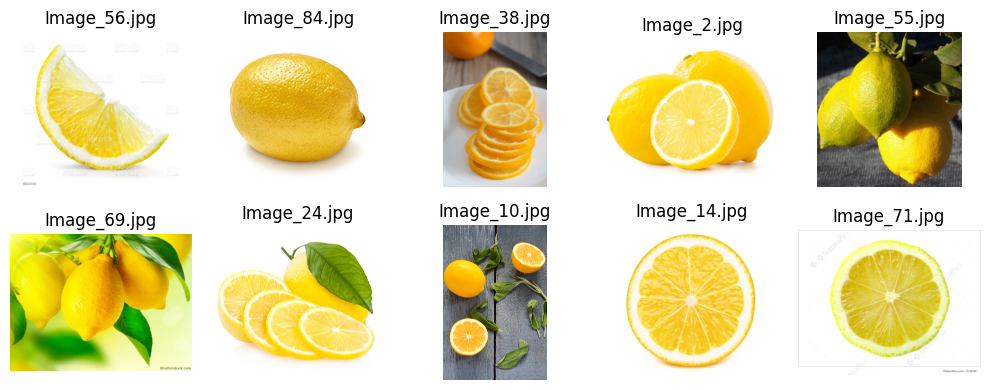

In [31]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'lemon', num_samples=10)

**Characteristics**

Color : Yellow,Pale Yellow

Shape: Lemon ukuran umumnya kecil, dan memiliki bentuk bundar.

Health Benefits: The vitamins, fiber, and plant compounds in lemons can be part of a healthy diet. It’s not common to actually eat a fresh lemon -- they’re too sour for most tastes -- unless you’re using preserved lemons.  

Reference : https://www.webmd.com/diet/health-benefits-lemon

9.Mango

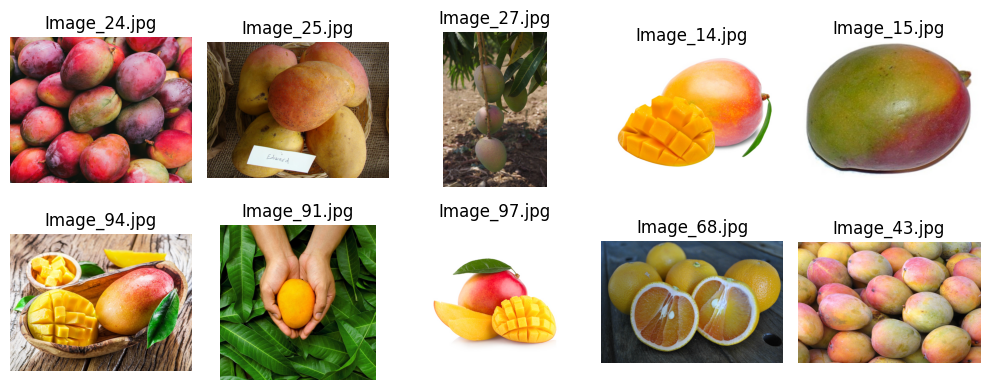

In [32]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'mango', num_samples=10)

**Characteristics**

Color : Yellow,Green,Red

Shape: Manggo ukuran umumnya kecil, dan memiliki bentuk bundar.

Health Benefits: The vitamins, minerals, and antioxidants in mangoes can provide important health benefits. For example, vitamin K helps your blood clot effectively and helps prevent anemia. It also plays an important role in strengthening your bones.

Reference : https://www.webmd.com/diet/health-benefits-mango

10.Onion

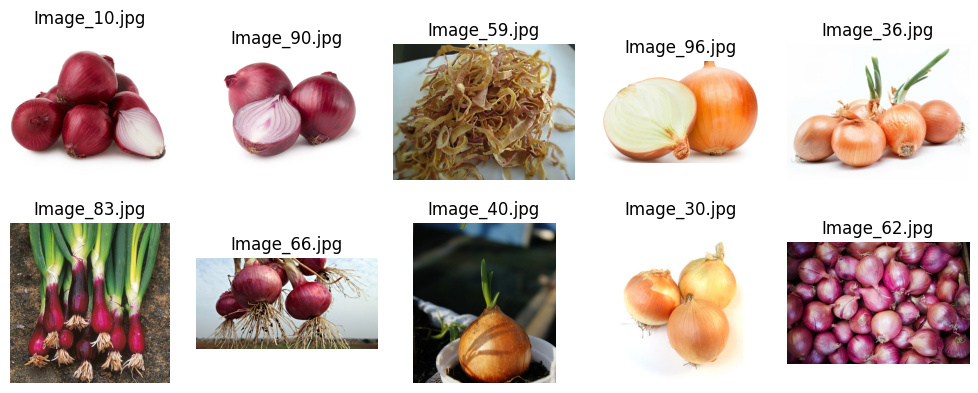

In [33]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'onion', num_samples=10)

**Characteristics**

Color : Purple,Coklat

Shape: Onion ukuran umumnya kecil, dan memiliki bentuk bundar.

Health Benefits: Scientists have linked onions to many possible health benefits, with most of them coming from the antioxidants in onions. Antioxidants help prevent cell damage in your body. Research shows that one particular antioxidant, called quercetin, protects health in several ways, such as fighting inflammation and boosting the immune system.

Reference : https://www.webmd.com/diet/health-benefits-onions

11.Orange

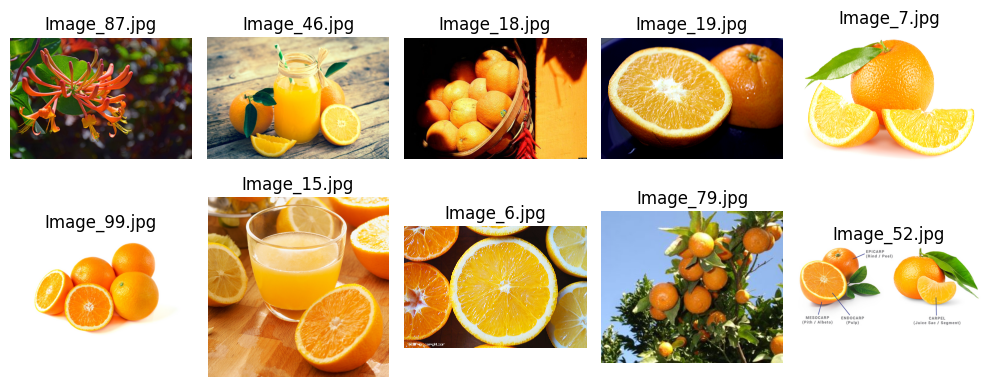

In [34]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'orange', num_samples=10)

**Characteristics**

Color : Orange,Yellow

Shape: Orange ukuran umumnya kecil, dan memiliki bentuk bundar.

Health Benefits: The vitamin C in oranges helps your body in lots of ways:
- Protects your cells from damage
- Helps your body make collagen, a protein that heals wounds and gives you smoother skin
- Makes it easier to absorb iron to fight anemia
- Boosts your immune system, your body's defense against germs
- Slows the advance of age-related macular degeneration (AMD), a leading cause of vision loss
- Helps fight cancer-causing free radicals

When you're feeling anxious, vitamin C can also lower your levels of the stress hormone cortisol and your blood pressure.

Reference : https://www.webmd.com/food-recipes/health-benefits-oranges

12.Paprika

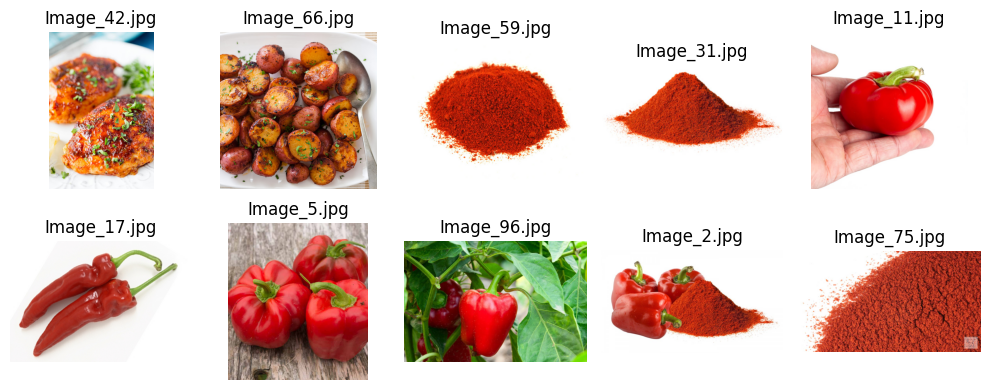

In [35]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'paprika', num_samples=10)

**Characteristics**

Color : Red,Coklat

Shape: Paprika ukuran umumnya kecil, dan memiliki bentuk bundar,dan ada yang berbentuk bubuk.

Health Benefits: Paprika contains capsaicin, a compound found in peppers that has been shown to have a wide range of health benefits. For example, it has antioxidant properties, can help reduce the risk of cancer and heart disease, improve immunity, and even alleviate gas.

Reference : https://www.webmd.com/diet/health-benefits-paprika

13.Pear

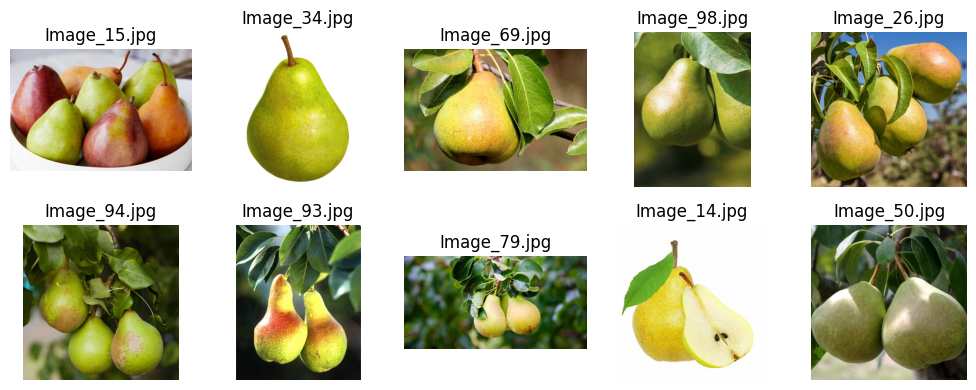

In [36]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'pear', num_samples=10)

**Characteristics**

Color : Red maron,Green

Shape: Pears ukuran umumnya kecil, dan memiliki bentuk bundar.

Health Benefits:They provide a significant amount of fiber and other essential nutrients and can help reduce the risk of heart disease, diabetes, and certain gut condition

Reference : https://www.medicalnewstoday.com/articles/285430#benefits

14.Raddish

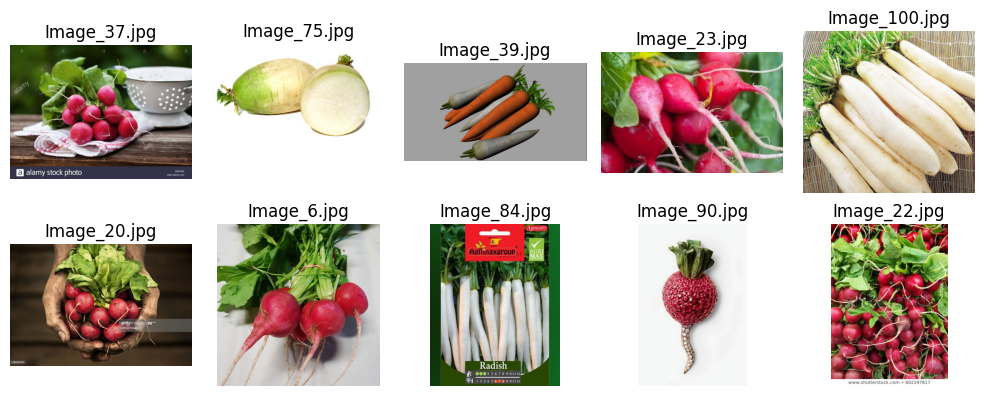

In [37]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'raddish', num_samples=10)

**Characteristics**

Color : White,Red

Shape: Raddish ukuran umumnya kecil, dan memiliki bentuk lonjong dan ada yang bundar.

Health Benefits: Radishes contain antioxidants like catechin, pyrogallol, vanillic acid, and other phenolic compounds. Antioxidants are molecules that fight free radicals in your body. Free radical compounds have been linked with many diseases, including cancer. Radishes also have a lot of vitamin C, which protects your cells from damage.

Reference : https://www.webmd.com/diet/health-benefits-radish

15.Soy Beans

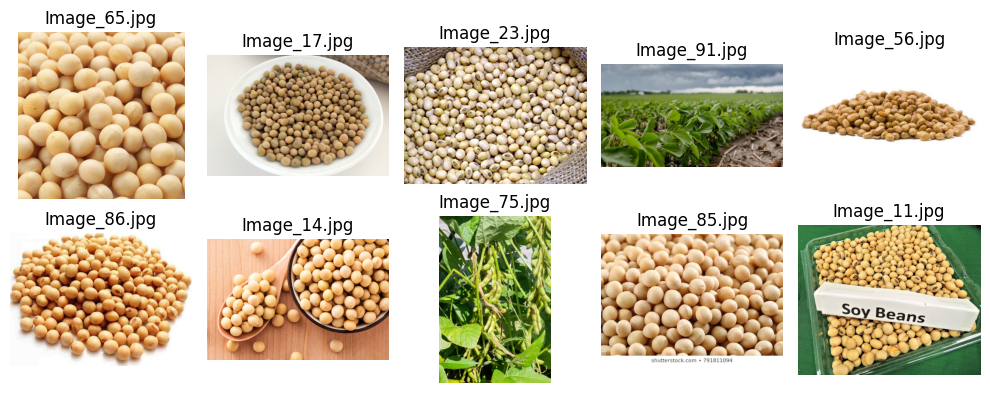

In [38]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'soy beans', num_samples=10)

**Characteristics**

Color : White,green,grey

Shape: Soy Beans ukuran umumnya kecil, dan memiliki bentuk bulat kecil.

Health Benefits: Like most whole foods, soybeans have a number of beneficial health effects:
- May reduce cancer risk
- Alleviation of menopause symptoms
- Bone health

Reference :https://www.healthline.com/nutrition/soybeans#benefits

16.Tomato

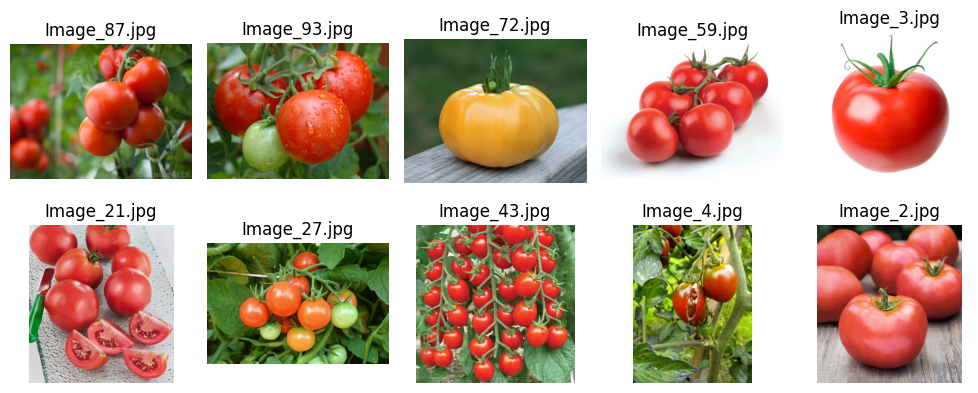

In [39]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'tomato', num_samples=10)

**Characteristics**

Color : Red

Shape: Tomato ukuran umumnya kecil, dan memiliki bentuk bulat/bundar.

Health Benefits: Tomatoes contain the antioxidant lycopene, which may provide several health benefits, including a reduced risk of heart disease and certain cancers.

Reference :https://www.webmd.com/diet/health-benefits-tomatoes

17.Watermelon

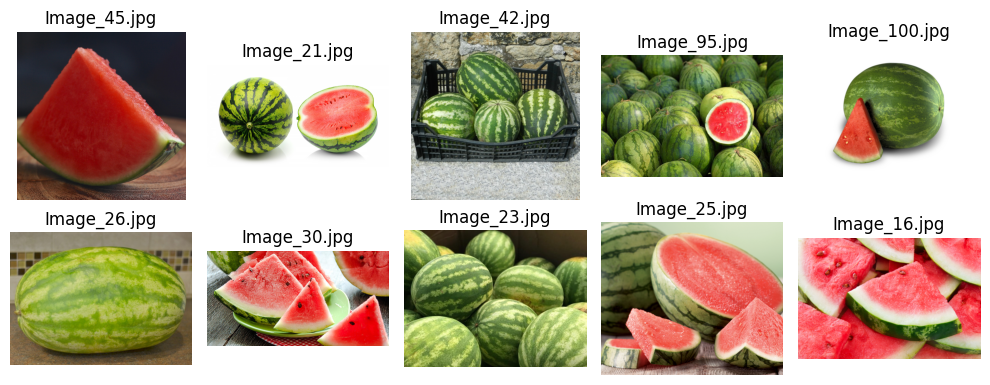

In [40]:
# visualize 'Bean' class
visualize_samples_by_label(train_df, 'watermelon', num_samples=10)

**Characteristics**

Color : Red,Green

Shape: Watermelon ukuran umumnya besar, dan memiliki bentuk bulat/bundar.

Health Benefits: Watermelon is rich in a variety of vitamins and antioxidants. For example, it contains the compound lycopene, which is important for heart health and may protect the skin from UV damage.

Reference : https://www.webmd.com/diet/health-benefits-watermelon

## Analysis
Dari semua hasil EDA dapat dilihat bahwa warna dominan semua fruit & vegetable adalah red,green,yellow. Dan dari hasil tersebut beberapa gambar memilik karakteristik warna lebih dari satu. Hal ini bisa berdapak dalam melakukan prediksi di model

# V.FEATURE ENGINEERING (FE)

1. Split feature (x) and Target (y)

In [41]:
# feature
X = 'images'
# target
y = 'label'

2. Split train, test, and val data

Datasets is already have train, test, and validation.

we just see the data

In [42]:
# show Data
print('Size train: ', train_df.shape)
print('Size validation: ', val_df.shape)
print('Size test: ', test_df.shape)
print('Size Inference', inf_df.shape)

Size train:  (1282, 2)
Size validation:  (158, 2)
Size test:  (154, 2)
Size Inference (4, 2)


3. Augmentation

In [43]:
# Define setting picture

img_height= 110 # set hight image
img_width= 110  # set width image
seed=7
batch_size= 32
input=[img_height,img_width,3]

In [44]:
# Augmentation Data

train_datagen = ImageDataGenerator(
              rescale= 1./255,        # This line scales down the pixel values of the images to the range of 0 to 1 by dividing them by 255.
              rotation_range= 0.1,    # Rotation is applied to the images within a range of 0.1 radians.
              width_shift_range= 0.2, # horizontal shifts can be applied to the images within a range of 20% of the total width.
              shear_range= 0.2,       # Shear transformations can be applied to the images within a range of 20%.
              zoom_range= 0.2,        # Zooming can be applied to the images within a range of 20%. It can zoom in or out on the objects within the images.
              horizontal_flip= True,  # Horizontal flips can be applied to the images with a 50% chance. It horizontally mirrors the images.
              vertical_flip = True    # Vertical flips can be applied to the images with a 50% chance. It vertically mirrors the images.
              )


In [45]:
# for validation data only use rescale
val_datagen = ImageDataGenerator(rescale=1./255)

# for test data only use rescale
test_datagen = ImageDataGenerator(rescale=1./255)

In [46]:
# train data
ds_train = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='images',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='sparse',
    batch_size=batch_size,
    shuffle=False,
    seed=seed)

# validation data
ds_val = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='images',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='sparse',
    batch_size=batch_size,
    shuffle=False,
    seed=seed)

# test data
ds_test = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='images',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='sparse',
    batch_size=batch_size,
    shuffle=False,
    seed=seed)

Found 1282 validated image filenames belonging to 17 classes.
Found 158 validated image filenames belonging to 17 classes.
Found 154 validated image filenames belonging to 17 classes.


In [47]:
# load class
ds_train.class_indices

{'apple': 0,
 'banana': 1,
 'cabbage': 2,
 'eggplant': 3,
 'garlic': 4,
 'jalepeno': 5,
 'kiwi': 6,
 'lemon': 7,
 'mango': 8,
 'onion': 9,
 'orange': 10,
 'paprika': 11,
 'pear': 12,
 'raddish': 13,
 'soy beans': 14,
 'tomato': 15,
 'watermelon': 16}

# VI. Model Definition

In [48]:
# create callbacks

callbacks = [
    EarlyStopping(monitor='val_loss', patience = 2),
    ModelCheckpoint('model.hdf5', monitor='val_loss', save_best_only=True)
]

1. Sequential API

In [49]:
# Model Arsitecture
model= Sequential()

#Layer Conv 1,
model.add(Conv2D(filters=16, kernel_size=3, activation='relu',
                       input_shape=input))
model.add(MaxPooling2D(pool_size=2, strides=2))

#Layer Conv 2
model.add(Conv2D(filters=32, kernel_size=3, activation='relu', padding= 'same'))
model.add(MaxPooling2D(pool_size=2, strides=2))

#Flatten
model.add(Flatten())

#Hidden Layer
model.add(Dense(units=32, activation='relu'))

#Output Layer
model.add(Dense(units=17, activation='softmax'))

#Summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 108, 108, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 54, 54, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 54, 54, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 27, 27, 32)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 23328)             0         
                                                                 
 dense (Dense)               (None, 32)                7

In [50]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

2. Model Improvement

On Improvement model i using Xception in Transfer Learning.

In [51]:
# create Xception Model
pretrained_model = tf.keras.applications.Xception(include_top=False,
                                                  input_shape=input,pooling='avg')
pretrained_model.trainable = False

83683744/83683744 [==============================] - 1s 0us/step


In [52]:
# Model Definition
model_tf= Sequential()
model_tf.add(pretrained_model) # add Xception for Transfer Learning

#fully connected layer
model_tf.add(Flatten())
model_tf.add(Dense(32, activation='relu')),
model_tf.add(Dense(units=17,activation='softmax'))

In [53]:
model_tf.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [54]:
model_tf.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 2048)              20861480  
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 32)                65568     
                                                                 
 dense_3 (Dense)             (None, 17)                561       
                                                                 
Total params: 20927609 (79.83 MB)
Trainable params: 66129 (258.32 KB)
Non-trainable params: 20861480 (79.58 MB)
_________________________________________________________________


# VII.MODEL TRAINING

1. Sequential API

In [55]:
# Training Based Model
%%time
history= model.fit(ds_train, batch_size= batch_size,
                           epochs= 20, validation_data= ds_val,
                           callbacks= callbacks)

Epoch 1/20
41/41 [==============================] - 60s 1s/step - loss: 2.9302 - accuracy: 0.0562 - val_loss: 2.7857 - val_accuracy: 0.0633
Epoch 2/20
41/41 [==============================] - 53s 1s/step - loss: 2.7669 - accuracy: 0.0858 - val_loss: 2.6953 - val_accuracy: 0.1392
Epoch 3/20
41/41 [==============================] - 54s 1s/step - loss: 2.6555 - accuracy: 0.1295 - val_loss: 2.5670 - val_accuracy: 0.1646
Epoch 4/20
41/41 [==============================] - 47s 1s/step - loss: 2.5763 - accuracy: 0.1576 - val_loss: 2.3965 - val_accuracy: 0.2278
Epoch 5/20
41/41 [==============================] - 48s 1s/step - loss: 2.4603 - accuracy: 0.1817 - val_loss: 2.2434 - val_accuracy: 0.2911
Epoch 6/20
41/41 [==============================] - 52s 1s/step - loss: 2.3820 - accuracy: 0.2176 - val_loss: 2.1237 - val_accuracy: 0.2722
Epoch 7/20
41/41 [==============================] - 47s 1s/step - loss: 2.2822 - accuracy: 0.2590 - val_loss: 2.0175 - val_accuracy: 0.2975
Epoch 8/20
41/41 [==

2. Improvement

In [56]:
# Training Improvement Model
%%time
history4= model_tf.fit(ds_train, batch_size= batch_size,
                           epochs= 20, validation_data= ds_val,
                           callbacks= callbacks)

Epoch 1/20
41/41 [==============================] - 118s 3s/step - loss: 2.4885 - accuracy: 0.2520 - val_loss: 1.7812 - val_accuracy: 0.4557
Epoch 2/20
41/41 [==============================] - 106s 3s/step - loss: 1.7547 - accuracy: 0.4688 - val_loss: 1.1118 - val_accuracy: 0.6139
Epoch 3/20
41/41 [==============================] - 113s 3s/step - loss: 1.3286 - accuracy: 0.6100 - val_loss: 0.8320 - val_accuracy: 0.7468
Epoch 4/20
41/41 [==============================] - 105s 3s/step - loss: 1.2025 - accuracy: 0.6373 - val_loss: 0.7222 - val_accuracy: 0.7911
Epoch 5/20
41/41 [==============================] - 105s 3s/step - loss: 1.0776 - accuracy: 0.6724 - val_loss: 0.5483 - val_accuracy: 0.8544
Epoch 6/20
41/41 [==============================] - 112s 3s/step - loss: 0.9693 - accuracy: 0.7176 - val_loss: 0.5535 - val_accuracy: 0.8354
Epoch 7/20
41/41 [==============================] - 113s 3s/step - loss: 0.9112 - accuracy: 0.7223 - val_loss: 0.4981 - val_accuracy: 0.8481
Epoch 8/20
41

# VII.MODEL EVALUATION

## 1 - Sequential

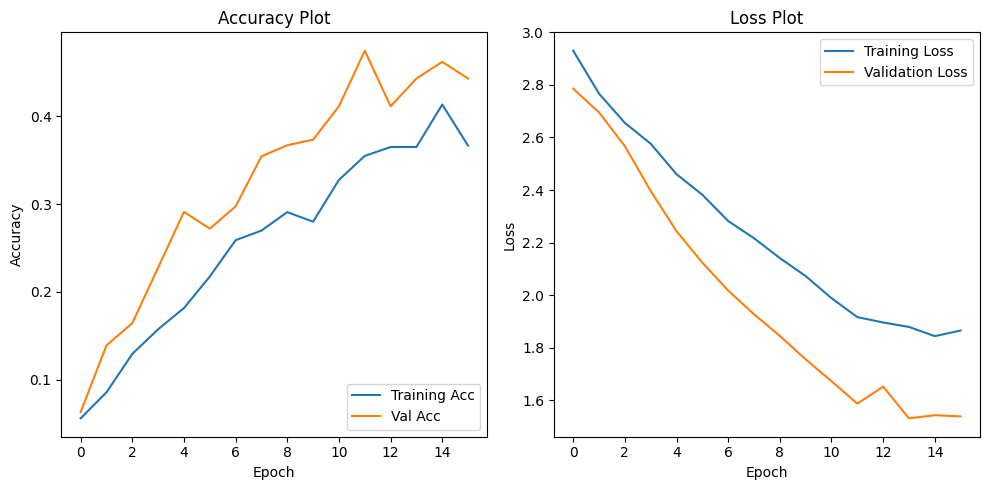

In [57]:
# Plot accuracy
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy Plot')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Plot')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc="upper right")

plt.tight_layout()
plt.show()


Dari hasil graphic dapat dilihat bahwa hasil evaluation model default sebenarnya sudah termasuk dalam `goodfit` tetapi memiliki beberapa `explosion` dan tidak stabil

In [58]:
# result Loss and Accuracy
test_results = model.evaluate(ds_test, verbose=0)
print(f'Test Loss     : {test_results[0]:.4f}')
print(f'Test Accuracy : {test_results[1]:.4f}')

Test Loss     : 1.5343
Test Accuracy : 0.4481


Dari hasil loss dan accuracy dapat dilihat bahwa modeel memiliki nilai yang sangat tinggi dengan akurasi yang rendah.

In [59]:
# Predict test data
prediction = model.predict(ds_test)

5/5 [==============================] - 6s 1s/step


In [60]:
y_pred = np.argmax(model.predict(ds_test), axis=-1)
y_pred

5/5 [==============================] - 6s 1s/step


array([ 8,  2, 15,  9,  4, 11,  6,  3,  2,  3,  0,  2, 15,  8,  9,  7,  7,
        2, 14,  3, 15, 14,  7,  6,  2, 15,  6, 14,  9, 11,  9, 11,  8,  5,
        9, 15,  8, 10,  7,  6,  7, 11,  9,  7,  1,  2, 14, 16,  0, 16,  4,
        5, 15,  2, 11, 10,  6,  3,  7, 14,  9,  8, 14,  4, 16,  5,  6,  2,
        2, 16, 11, 14, 11,  9,  6, 12,  7,  7,  6,  8, 16,  2,  2,  6, 14,
        6,  3,  4,  2,  1,  8,  9,  9,  0,  9,  2, 15,  8,  7,  9,  3, 16,
        4,  8,  6, 16, 12,  3,  6,  2, 15, 15, 11,  6,  9, 14,  6,  6, 11,
        7, 11,  9, 11, 15,  8,  5, 15,  2,  4,  3,  5,  0,  5,  3,  3,  9,
        6, 14, 15, 14,  8,  7,  7,  6,  1, 11,  7,  7, 15,  7,  8,  2, 14,
        9])

In [61]:
# create class name
class_names = ['apple','banana','cabbage','eggplant','garlic','jalepeno','kiwi','lemon'
              ,'mango','onion','orange','paprika','pear','raddish','soy beans','tomato','watermelon']
class_names

['apple',
 'banana',
 'cabbage',
 'eggplant',
 'garlic',
 'jalepeno',
 'kiwi',
 'lemon',
 'mango',
 'onion',
 'orange',
 'paprika',
 'pear',
 'raddish',
 'soy beans',
 'tomato',
 'watermelon']

In [62]:
# change number to string in class
y_pred1=np.array(class_names)[y_pred]
y_pred1

array(['mango', 'cabbage', 'tomato', 'onion', 'garlic', 'paprika', 'kiwi',
       'eggplant', 'cabbage', 'eggplant', 'apple', 'cabbage', 'tomato',
       'mango', 'onion', 'lemon', 'lemon', 'cabbage', 'soy beans',
       'eggplant', 'tomato', 'soy beans', 'lemon', 'kiwi', 'cabbage',
       'tomato', 'kiwi', 'soy beans', 'onion', 'paprika', 'onion',
       'paprika', 'mango', 'jalepeno', 'onion', 'tomato', 'mango',
       'orange', 'lemon', 'kiwi', 'lemon', 'paprika', 'onion', 'lemon',
       'banana', 'cabbage', 'soy beans', 'watermelon', 'apple',
       'watermelon', 'garlic', 'jalepeno', 'tomato', 'cabbage', 'paprika',
       'orange', 'kiwi', 'eggplant', 'lemon', 'soy beans', 'onion',
       'mango', 'soy beans', 'garlic', 'watermelon', 'jalepeno', 'kiwi',
       'cabbage', 'cabbage', 'watermelon', 'paprika', 'soy beans',
       'paprika', 'onion', 'kiwi', 'pear', 'lemon', 'lemon', 'kiwi',
       'mango', 'watermelon', 'cabbage', 'cabbage', 'kiwi', 'soy beans',
       'kiwi', 'eggpl

In [63]:
# create dataframe to save prediction
pred_result_pred = pd.DataFrame(y_pred1, columns=['y_pred'])
pred_result_pred

,y_pred
0,mango
1,cabbage
2,tomato
3,onion
4,garlic
...,...
149,lemon
150,mango
151,cabbage
152,soy beans


In [64]:
# reset index
test_df_reset = test_df.reset_index(drop=True)


In [65]:
test_df_reset

,images,label
0,/content/images/test/orange/Image_3.jpg,orange
1,/content/images/test/cabbage/Image_7.jpg,cabbage
2,/content/images/test/tomato/Image_9.jpg,tomato
3,/content/images/test/banana/Image_2.jpg,banana
4,/content/images/test/soy beans/Image_4.jpg,soy beans
...,...,...
149,/content/images/test/lemon/Image_4.jpg,lemon
150,/content/images/test/orange/Image_6.jpg,orange
151,/content/images/test/cabbage/Image_6.jpg,cabbage
152,/content/images/test/garlic/Image_6.jpg,garlic


In [66]:
# concat label and y_pred
result_model_pred1 = pd.concat([test_df_reset, pred_result_pred], axis=1)
result_model_pred1 = result_model_pred1.reset_index(drop=True)
result_model_pred1[['label', 'y_pred']]

,label,y_pred
0,orange,mango
1,cabbage,cabbage
2,tomato,tomato
3,banana,onion
4,soy beans,garlic
...,...,...
149,lemon,lemon
150,orange,mango
151,cabbage,cabbage
152,garlic,soy beans


Note : label (y_actual) in test data and y_pred(result prediction)

In [67]:
print('Best Model classification report test : \n',classification_report(result_model_pred1['label'], result_model_pred1['y_pred']))

Best Model classification report test : 
               precision    recall  f1-score   support

       apple       1.00      0.44      0.62         9
      banana       0.00      0.00      0.00         9
     cabbage       0.56      1.00      0.72         9
    eggplant       0.90      0.90      0.90        10
      garlic       0.67      0.44      0.53         9
    jalepeno       0.50      0.33      0.40         9
        kiwi       0.47      0.80      0.59        10
       lemon       0.31      0.71      0.43         7
       mango       0.50      0.60      0.55        10
       onion       0.50      1.00      0.67         8
      orange       0.50      0.14      0.22         7
     paprika       0.08      0.10      0.09        10
        pear       0.50      0.10      0.17        10
     raddish       0.00      0.00      0.00         7
   soy beans       0.17      0.20      0.18        10
      tomato       0.38      0.50      0.43        10
  watermelon       0.43      0.30      

<Axes: >

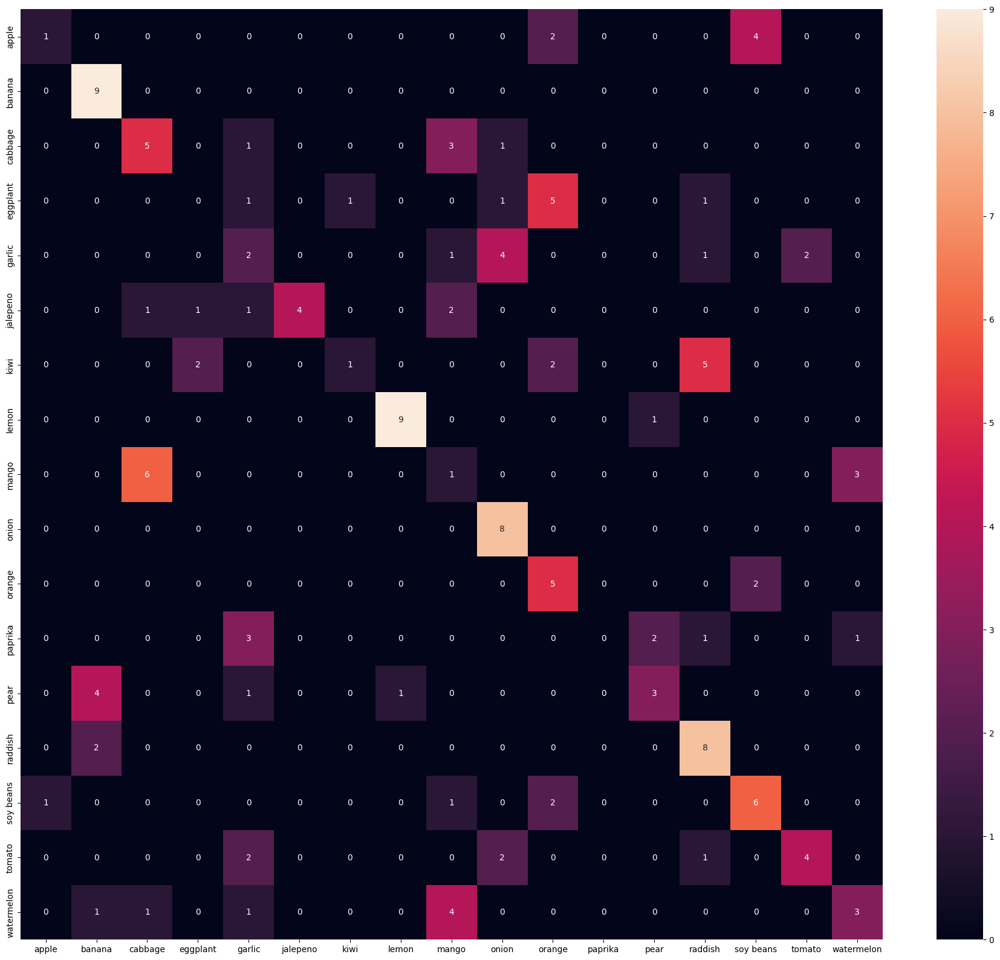

In [68]:
# Display Confussion Matrix

np.set_printoptions(suppress=True)

plt.figure(figsize=(23, 20))
model_confussionmatrix = confusion_matrix(result_model_pred1['label'], result_model_pred1['y_pred'], labels=result_model_pred1['label'].unique())
sns.heatmap(model_confussionmatrix, annot=True , xticklabels=class_names, yticklabels=class_names)

dari hasil diatas dapat dilihat bahwa hasil prediksi hampir semua mendapat nilai `0`. Hal ini tidak baik dalam melakukan prediksi.

## 2. Improvement

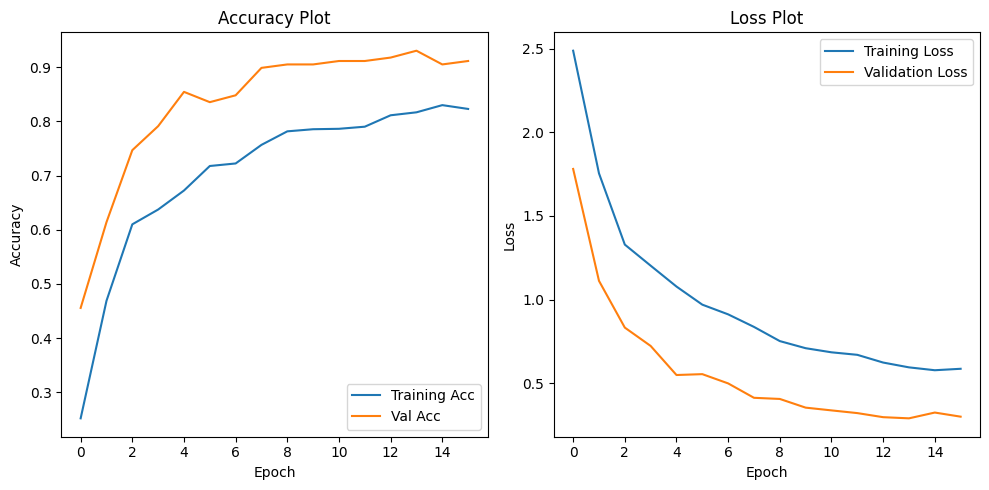

In [69]:
# Plot accuracy and loss in the same figure
plt.figure(figsize=(10, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history4.history['accuracy'], label='Training Acc')
plt.plot(history4.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy Plot')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history4.history['loss'], label='Training Loss')
plt.plot(history4.history['val_loss'], label='Validation Loss')
plt.title('Loss Plot')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc="upper right")

plt.tight_layout()
plt.show()


Setelah dilakukan improvement dapat dilihat hasilnya bahwa data sudah `goodfit` dan lebih stabil.

In [70]:
# resul Loss and Accuracy
test_results2 = model_tf.evaluate(ds_test, verbose=0)
print(f'Test Loss     : {test_results2[0]:.4f}')
print(f'Test Accuracy : {test_results2[1]:.4f}')

Test Loss     : 0.2970
Test Accuracy : 0.9156


dari data grapic diatas dapat dilihat hasilnya bahwa loss nya rendah dan akurasi yang tinggi.

In [71]:
# predict using Transfer learning model
prediction2 = model_tf.predict(ds_test)

5/5 [==============================] - 13s 2s/step


In [72]:
y_pred2 = np.argmax(model_tf.predict(ds_test), axis=-1)
y_pred2

5/5 [==============================] - 11s 2s/step


array([10,  2,  8,  5, 14,  8, 12,  3,  2,  3,  0,  2, 11, 10,  9,  7,  7,
        2, 13,  3, 15, 15,  1, 12,  5, 11,  6,  0,  4, 15, 14, 15,  7,  5,
        9, 15,  8, 10,  8, 13, 12,  8,  4,  1, 12,  2, 14, 11,  0, 13,  4,
        5, 15,  6, 16,  8,  1,  3,  8, 16, 14,  8, 14,  4, 11,  5, 12,  6,
       16, 11, 15, 13, 11,  9,  6,  1,  1,  1, 14,  8, 16,  2,  5, 12, 13,
        6,  3,  4,  1, 12,  8,  4, 15,  0, 14,  2, 11,  8,  7, 14,  3, 16,
        4, 10, 12, 16, 12,  3,  6,  5,  5, 11, 16,  6,  9,  4,  6,  4, 16,
        7, 14,  9, 16, 15,  7,  5, 11,  2, 14,  3, 13,  0, 13,  3,  5,  9,
        6,  5, 16,  5,  8, 12,  7,  6,  4,  0,  1,  7,  7,  7, 10,  2,  4,
       14])

In [73]:
# change number to string in class
y_pred2=np.array(class_names)[y_pred2]

In [74]:
y_pred2

array(['orange', 'cabbage', 'mango', 'jalepeno', 'soy beans', 'mango',
       'pear', 'eggplant', 'cabbage', 'eggplant', 'apple', 'cabbage',
       'paprika', 'orange', 'onion', 'lemon', 'lemon', 'cabbage',
       'raddish', 'eggplant', 'tomato', 'tomato', 'banana', 'pear',
       'jalepeno', 'paprika', 'kiwi', 'apple', 'garlic', 'tomato',
       'soy beans', 'tomato', 'lemon', 'jalepeno', 'onion', 'tomato',
       'mango', 'orange', 'mango', 'raddish', 'pear', 'mango', 'garlic',
       'banana', 'pear', 'cabbage', 'soy beans', 'paprika', 'apple',
       'raddish', 'garlic', 'jalepeno', 'tomato', 'kiwi', 'watermelon',
       'mango', 'banana', 'eggplant', 'mango', 'watermelon', 'soy beans',
       'mango', 'soy beans', 'garlic', 'paprika', 'jalepeno', 'pear',
       'kiwi', 'watermelon', 'paprika', 'tomato', 'raddish', 'paprika',
       'onion', 'kiwi', 'banana', 'banana', 'banana', 'soy beans',
       'mango', 'watermelon', 'cabbage', 'jalepeno', 'pear', 'raddish',
       'kiwi', 'egg

In [75]:
# create dataframe
pred_result_pred2 = pd.DataFrame(y_pred2, columns=['y_pred_improve'])
pred_result_pred2

,y_pred_improve
0,orange
1,cabbage
2,mango
3,jalepeno
4,soy beans
...,...
149,lemon
150,orange
151,cabbage
152,garlic


In [76]:
# concat test data and result prediction
result_model_pred2 = pd.concat([test_df_reset, pred_result_pred2], axis=1)
result_model_pred2 = result_model_pred2.reset_index(drop=True)
result_model_pred2[['label', 'y_pred_improve']]


,label,y_pred_improve
0,orange,orange
1,cabbage,cabbage
2,tomato,mango
3,banana,jalepeno
4,soy beans,soy beans
...,...,...
149,lemon,lemon
150,orange,orange
151,cabbage,cabbage
152,garlic,garlic


Note : label (y_actual) in test data and y_pred_improve(result prediction using transfer learning Xception)

In [77]:
print('Best Model classification report test : \n',classification_report(result_model_pred2['label'], result_model_pred2['y_pred_improve']))

Best Model classification report test : 
               precision    recall  f1-score   support

       apple       1.00      0.67      0.80         9
      banana       0.88      0.78      0.82         9
     cabbage       1.00      1.00      1.00         9
    eggplant       1.00      0.90      0.95        10
      garlic       0.82      1.00      0.90         9
    jalepeno       0.67      0.89      0.76         9
        kiwi       1.00      1.00      1.00        10
       lemon       0.70      1.00      0.82         7
       mango       0.83      1.00      0.91        10
       onion       1.00      0.75      0.86         8
      orange       1.00      0.71      0.83         7
     paprika       1.00      0.90      0.95        10
        pear       1.00      1.00      1.00        10
     raddish       1.00      1.00      1.00         7
   soy beans       0.91      1.00      0.95        10
      tomato       1.00      0.90      0.95        10
  watermelon       1.00      1.00      

<Axes: >

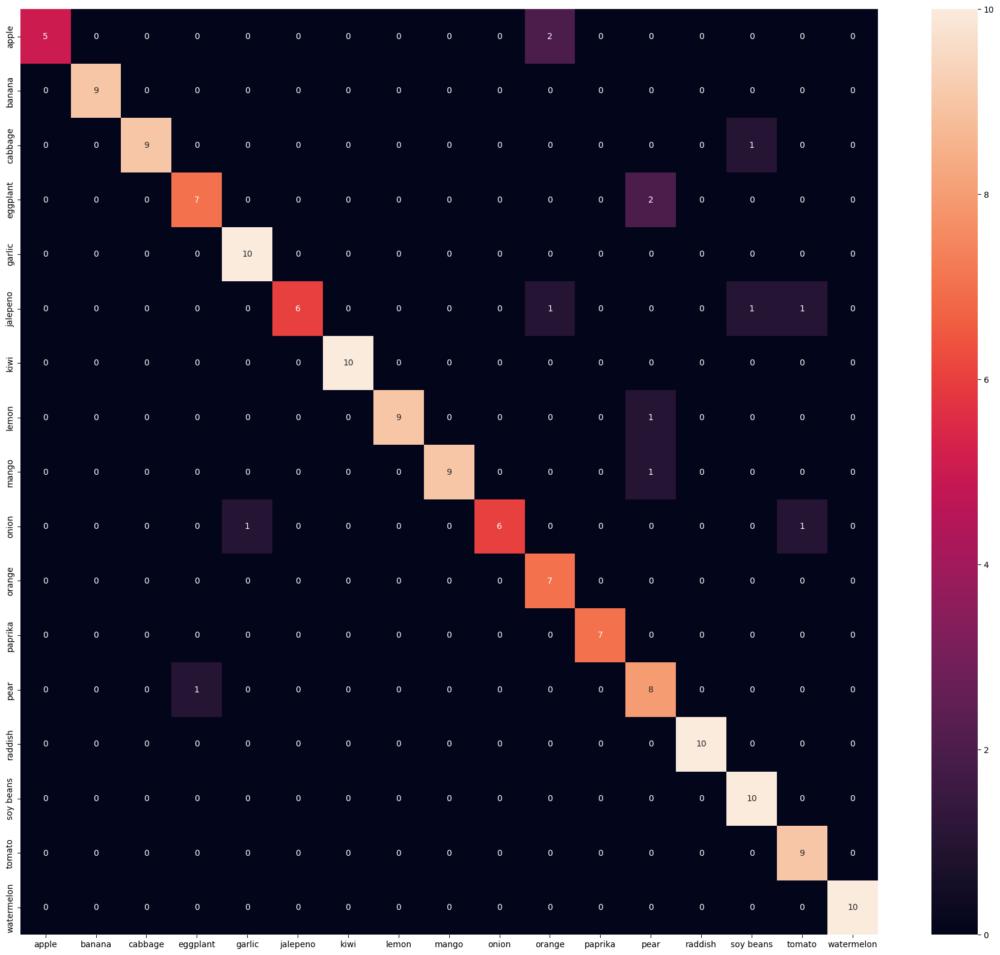

In [78]:
# Display Confussion Matrix

np.set_printoptions(suppress=True)

plt.figure(figsize=(23, 20))
model_confussionmatrix = confusion_matrix(result_model_pred2['label'], result_model_pred2['y_pred_improve'], labels=result_model_pred2['label'].unique())
sns.heatmap(model_confussionmatrix, annot=True , xticklabels=class_names, yticklabels=class_names)

Dari hasil diatas dapat dilihat bahwa model hasil improvement dapat melakukan prediksi dengan benar. selanjutnya saya akan melihat bagaimana jika data yang diprediksi salah

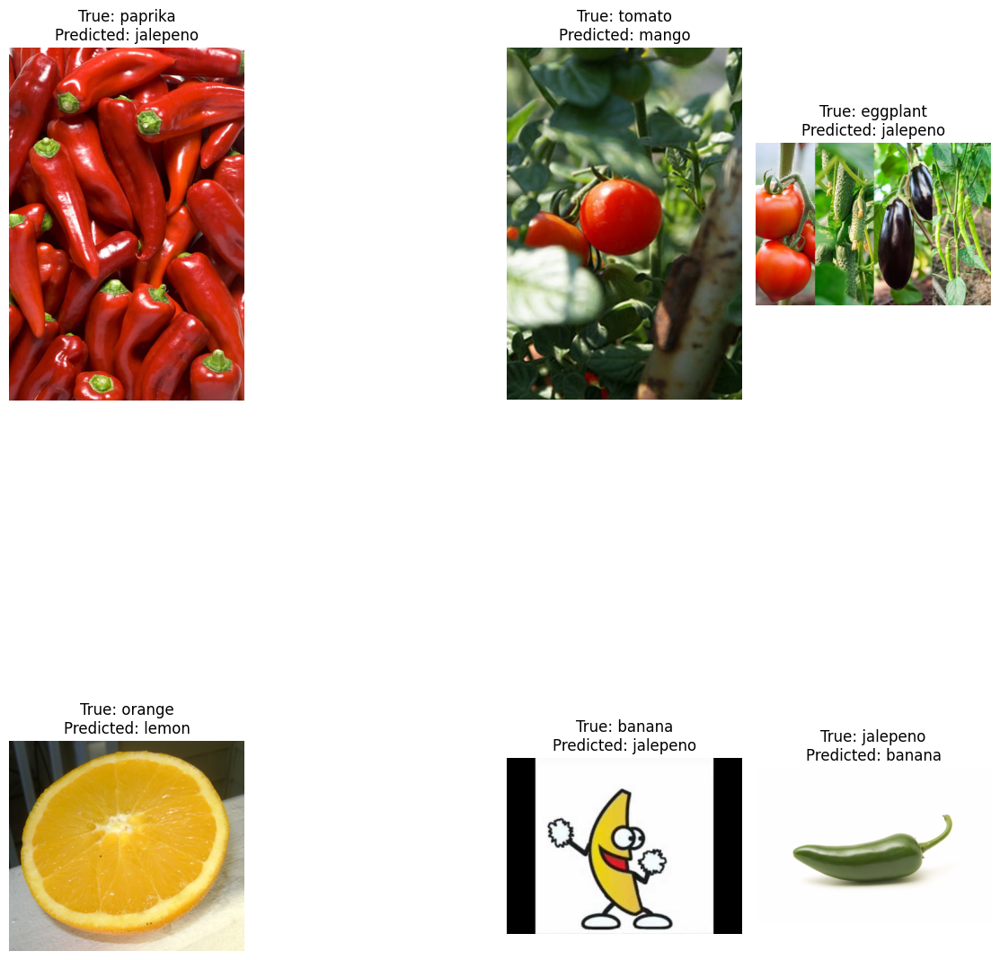

In [79]:
incorrect_predictions = result_model_pred2[result_model_pred2['label'] != result_model_pred2['y_pred_improve']].head(10)

plt.figure(figsize=(14, 14))
for i, row in incorrect_predictions.iterrows():
    image_path = row[test_df.columns.get_loc('images')]
    true_label = row['label']
    predicted_label = row['y_pred_improve']

    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 5, i % 10 + 1)
    plt.imshow(img)
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}')
    plt.axis('off')

plt.tight_layout()
plt.show()


Dari data diatas dapat dilihat beberapa hasil prediksi yang salah, dikarenakan memiliki karakteristik yang hampir sama. untuk mengurangi hal ini dapat dilakukan improvement dengan melakukan reset model yang lebih mendalam dan menambahkan epoch yang lebih dari 20 untuk mendapat hasil yang lebih akurat.

# IX. Model Saving

Based on result Model Improvement is better than based model.

In [80]:
# Saving model
model_tf.save("best_model.h5")

# X. Model Inference

In [81]:
import requests
urls = ['https://i.pinimg.com/236x/cc/52/ce/cc52ceee060e06a1eade93b8975185c3.jpg',
        'https://i.pinimg.com/236x/71/3e/e1/713ee181684c2e72d81158a48ec7907b.jpg']

for index, url in enumerate(urls):
  response = requests.get(url)
  filename = 'img-test-' + str(index+1) + '.jpg'
  file = open(filename, "wb")
  file.write(response.content)
  file.close()

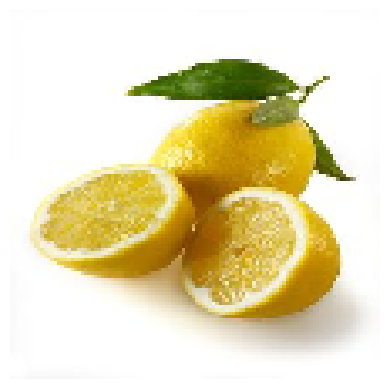

1/1 [==============================] - 1s 1s/step
Result     :  [[0.02936817 0.00007516 0.0000045  0.00017991 0.00005772 0.00162527
  0.00827617 0.50858253 0.00610166 0.01082354 0.2269252  0.00239244
  0.19539489 0.00363587 0.00053322 0.00402711 0.00199664]]
Max Class  :  7
Class Name :  lemon



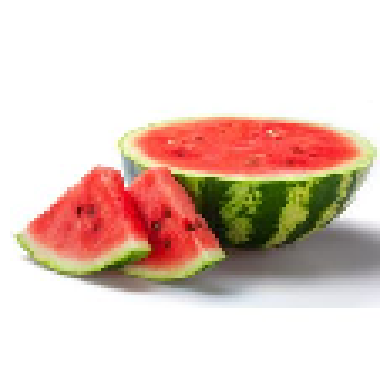

1/1 [==============================] - 0s 86ms/step
Result     :  [[0.00001147 0.00001745 0.0002849  0.0000031  0.00000016 0.00000958
  0.00000101 0.00003668 0.00034996 0.00000397 0.00020601 0.00034514
  0.00000451 0.00008134 0.00009772 0.0000562  0.9984908 ]]
Max Class  :  16
Class Name :  watermelon



In [82]:
# Test Images

from tensorflow.keras.preprocessing import image

img_paths = ['img-test-1.jpg',
             'img-test-2.jpg']

for filename in img_paths:
  img = image.load_img(filename, target_size=(input))
  plt.imshow(img)
  plt.axis('off')
  plt.show()

  img_array = tf.keras.preprocessing.image.img_to_array(img)
  img_batch = np.expand_dims(img_array, axis=0)

  img_batch = img_batch / 255.0

  prediction_inf = model_tf.predict(img_batch)
  result_max_proba = prediction_inf.argmax(axis=-1)[0]
  result_class = class_names[result_max_proba]

  print('Result     : ', prediction_inf)
  print('Max Class  : ', result_max_proba)
  print('Class Name : ', result_class)
  print('')

## Evaluated Inferences

Picture 1 : Model successfully predicted lemon.

Picture 2 : Model successfully predicted watermelon.


# XI. Conclusion

## EDA

Banyak fruit dan vegetable yang memiliki karakteristik yang sama.

dan warna yang dominan adalah merah,orange,green.

dan ada beberapa yang memiliki jumlah warna yang lebih dari satu.

## Model

**baseline model :**

Test Loss     : 1.5343

Test Accuracy : 0.4481

**Improvement Model:**

Test Loss     : 0.2970
Test Accuracy : 0.9156

Dari hasil model result diatas dapat dilihat hasil Improvent lebih baik.

`Improvement is succesfully.`

## Advantages of the model:

* Akurasi yang tinggi

* Training data yang sangat besar

* Terdapat 17 class yang dapat diprediksi

## Model limitations:


*   Gagal memprediksi yang memiliki jenis yang sama
*   Model gagal dalam memprediksi dalam bentuk logo/gambar 2D
*   Model gagal dalam mempredik bentuk dan warna yang sama

## Recommendation:

Menambah kapasitas class supaya model dapat memprediksi lebih banyak dan bervariasi, kurangi data yang berbentuk sama dan karakteristik yang sudah untuk di bedakan. Tambahkan parameter yang baik supaya hasil prediksi lebih sempurna